In [1]:
import os, sys

sys.path.append('/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages')

import dicom
import glob
import numpy as np
import matplotlib.pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [2]:
# dicom_dir = os.path.join(os.getcwd(), 'data', 'DICOM', 'hires_ct')
dicom_dir = os.path.join(os.getcwd(),'DC.PHANTOM^DC.MP-Mk5.20180606_DC.PHANTOM_CT_2018-06-06_163223_RT^CYBERKNIFE.BRAIN.(Adult)_CT.140kVp..1.0..H50s_n234__00000')
n_dicoms = len(os.listdir(dicom_dir))

dicom_list = glob.glob(os.path.join(dicom_dir,'*.dcm'))
dicom_list.sort()

ref_dcm = dicom.read_file(dicom_list[0])

(nx, ny, nz) = (
    int(ref_dcm.Columns),
    int(ref_dcm.Rows),
    int(n_dicoms)
)

(dx, dy, dz) = (
    float(ref_dcm.PixelSpacing[0]),
    float(ref_dcm.PixelSpacing[1]),
    float(ref_dcm.SliceThickness)
)

vol = np.ndarray((nx, ny, nz), dtype=ref_dcm.pixel_array.dtype)
for zi, dicom_fname in enumerate(dicom_list):
    ds = dicom.read_file(dicom_fname)
    vol[:, :, zi] = ds.pixel_array

<Figure size 1440x1440 with 0 Axes>

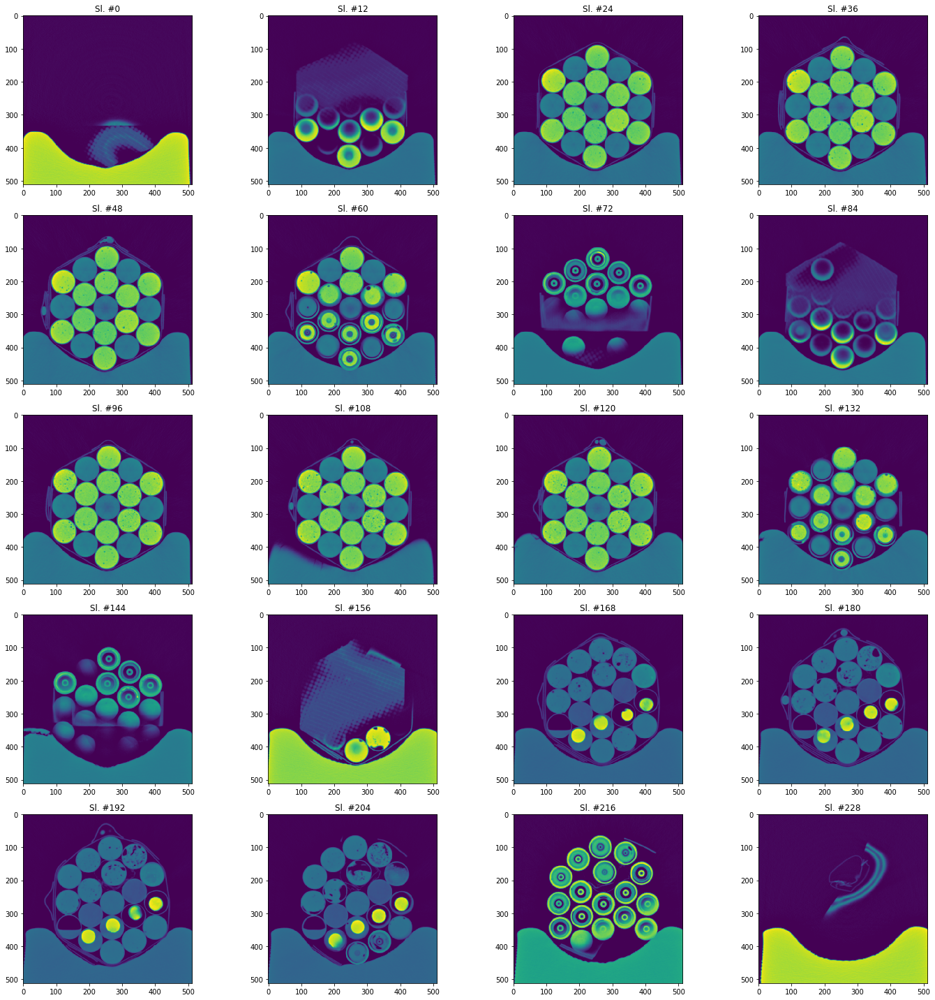

In [3]:
# plot a couple slices (sanity check)

plt.close()
plt.figure(figsize=(20.0, 20.0))

slices = np.arange(0, nz, np.ceil(nz/20), dtype=np.uint8)
#print((nx,ny,nz),axial_planes)
fig, ax = plt.subplots(5, 4, figsize=(20.0, 20.0))
for pl, zi in enumerate(slices):
    ai=ax[int(pl/4)][int(pl%4)]
    ai.imshow(vol[:,:,zi])
    ai.set_title('Sl. #{:d}'.format(zi))

fig.tight_layout()
fig.patch.set_facecolor('#ffffff')
plt.show()

fig.savefig('ia_rf1-20000.png')

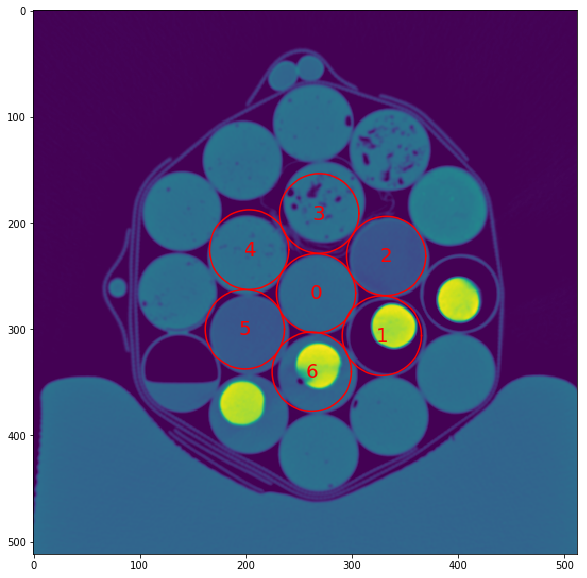

In [4]:
import cv2
from IPython.display import display, HTML
import base64

plt.close()
fig = plt.figure(figsize=(10.0, 10.0))

# sli = int(nz/2)
sli = 186
scl_slice = (vol[:,:,sli] - np.min(vol[:,:,sli]))/(np.max(vol[:,:,sli]) - np.min(vol[:,:,sli]))
plt.imshow(scl_slice)

rc = 13.5 # mm
cx0 = int(nx/2) + 10
cy0 = int(ny/2) + 10

#plt.plot(cx0, cy0, 'rx')
plt.text(cy0, cx0, '{:d}'.format(0), fontdict = {
    'color': 'red',
    'fontsize': 20,
    'horizontalalignment' : 'center',
    'verticalalignment' : 'center'
})
th = np.linspace(0.0, 2*np.pi, 100)
xx = rc/dx * np.cos(th) + cy0
yy = rc/dy * np.sin(th) + cx0
plt.plot(xx, yy, 'r')


dth = 1.0
for ci in range(6):
    thi = dth + ci * np.pi / 3.0
    cx = int(((cx0 * dx) + (2 * rc * np.cos(thi)))/dx)
    cy = int(((cy0 * dy) + (2 * rc * np.sin(thi)))/dy)
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })
    
plt.show()
fig.savefig('ia_rf1-20000_sl-{:d}.png'.format(sli))

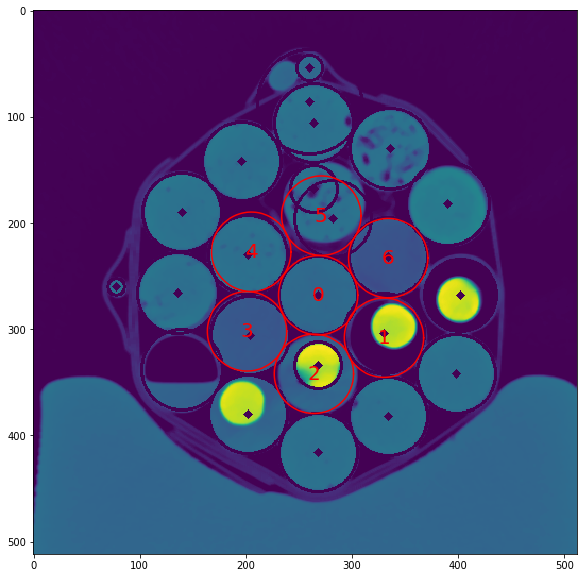

In [5]:
# Automatically find proper rotation and translation params for ROIs.
# This uses a hough circle transform algorithm, and correctness should be
# visually verified below.
plt.close()

img = scl_slice*255.0
img = img.astype(np.uint8)
img = cv2.medianBlur(img,5)
circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,
                            param1=50,param2=30,minRadius=int(rc-50),maxRadius=int(rc+50))
circles = np.uint16(np.around(circles))

retval, image = cv2.threshold(img, 50, 255, cv2.THRESH_BINARY)
# print(len(target_circles[0,:]))

for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(img,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(img,(i[0],i[1]),2,(0,0,255),3)

fig = plt.figure(figsize=(10.0, 10.0))

# Initial parameters:
cx0 = int(nx/2) + 10
cy0 = int(ny/2) + 10
dth = 1.0

# Central ROI circle assumed to be closest to initial param center:
try:
    circle_coords = circles[0,:]
    idx = (np.abs( np.square(circle_coords[:,0]-cx0) + np.square(circle_coords[:,1]-cy0) )).argmin()
    center_circle = circle_coords[idx]
    cx0 = center_circle[1]
    cy0 = center_circle[0]
except:
    raise Exception('No ROIs detected... stopping.')
    
centX = cx0
centY = cy0

plt.text(cy0, cx0, '{:d}'.format(0), fontdict = {
    'color': 'red',
    'fontsize': 20,
    'horizontalalignment' : 'center',
    'verticalalignment' : 'center'
})
th = np.linspace(0.0, 2*np.pi, 100)
xx = rc/dx * np.cos(th) + cy0
yy = rc/dy * np.sin(th) + cx0
plt.plot(xx, yy, 'r')

for ci in range(6):
    thi = dth - ci * np.pi / 3.0
    cx = int(((cx0 * dx) + (2 * rc * np.cos(thi)))/dx)
    cy = int(((cy0 * dy) + (2 * rc * np.sin(thi)))/dy)
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })
    

plt.imshow(img)
plt.show()

In [6]:
# Generate ROIs

# Container dimensions
nc = 18
rc = 13.5 # Container radius (mm)
hc = 95.25/2 # Container height (mm) NOTE: outer dimensions

# ROI dimensions (use the approx. center)
rr = rc * 0.25
hr = hc * 0.75

# image center
im_cx = nx * dx / 2.0
im_cy = ny * dy / 2.0
im_cz = nz * dz / 2.0

# some fudge factors
del_th = 1.0 # angle offset
# cz0 = im_cz # center of 10-dram vials is at approx. axial slice 35
cz0 = 186.0 * dz

# Commented to use automatic ROI algorithm:
# cy0 = im_cy + (10.0 * dy)
# cx0 = im_cx + (10.0 * dx)
cx0 = centX * dx
cy0 = centY * dy

# ROI labels
roi_labels = [ # All updated
    '0: (W01.1) (W01) Water from Tap',
    '1: (B02.2) (BB2) Bone Block, No Glue, in Air',
    '2: (N01.3) (N3) Liver (ground) in 20mL container',
    '3: (B02.3) (BB3) Bone Block, Glue, in Water',
    '4: (N01.1) (N1) Liver (ground) in 20mL container',
    '5: (A03.1) (IA1) Isopropyl Alcohol',
    '6: (B01.1) (BMP1) Bone Meal Powder',
    '7: (L01.3) (LS3(C)) Liver Stability, Fridge',
    '8: (I01.1) (I1) Intact Liver (Relative), prep: cut and "stuff"',
    '9: (L01.2) (LS2(B)) Liver Stability, Vacuum',
    '10: (I01.3) (I3) Intact Liver (Relative), prep: cut and "stuff"',
    '11: (A02.1) (A1) Acetone',
    '12: (A04.1) (PA1) Propargyl Alcohol',
    '13: (B02.1) (BB1) Bone Block, Glue, in Air',
    '14: (L01.4) (LS4(D)) Liver Stability, Freezer',
    '15: (I01.2) (I2) Intact Liver (Relative), prep: cut and "stuff"',
    '16: (N01.2) (N2) Liver (ground) in 20mL container',
    '17: (B02.4) (BB4) Bone Block, No Glue, in Water',
    '18: (L01.1) (LS1(A)) Liver Stability, in Air',
]

sys.path.append('/Users/tmcclave/Dropbox/Schoolwork/UCSF/QMRI/CT/ctdicomMK5/')
import roi

roi_info = []

# Center container:
roi_info.append({})
roi_info[0]['cx'] = cx0
roi_info[0]['cy'] = cy0
roi_info[0]['cz'] = cz0

roi_info[0]['ht'] = hr
roi_info[0]['rd'] = rr

roi_info[0]['mask'] = roi.CylinderROI(
    roi_info[0]['cx'],
    roi_info[0]['cy'],
    roi_info[0]['cz'],
    roi_info[0]['ht'],
    roi_info[0]['rd']
).generate_mask(nx, ny, nz, dx, dy, dz)

roi_info[0]['label'] = roi_labels[0]

# Other containers:
for ci in range(nc):
    if (ci < 12):
        if (ci % 2 == 0):
            thi = del_th - np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi)
            del_cy = 2 * rc * np.sin(thi)
        else:
            thi = np.pi + del_th - np.floor(ci/2) * np.pi / 3.0
            del_cx = 4 * rc * np.cos(thi)
            del_cy = 4 * rc * np.sin(thi)
    else:
        if (ci % 2 == 0):
            thi = np.pi/6.0 + del_th - np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi) * 2 * np.cos(np.pi / 6.0)
            del_cy = 2 * rc * np.sin(thi) * 2 * np.cos(np.pi / 6.0)
        else:
            thi = np.pi/6.0 + np.pi + del_th - np.floor(ci/2) * np.pi / 3.0
            del_cx = 2 * rc * np.cos(thi) * 2 * np.cos(np.pi / 6.0)
            del_cy = 2 * rc * np.sin(thi) * 2 * np.cos(np.pi / 6.0)
    
    roi_info.append({})
    roi_info[ci+1]['cx'] = cx0 + del_cx
    roi_info[ci+1]['cy'] = cy0 + del_cy
    roi_info[ci+1]['cz'] = cz0
    
    roi_info[ci+1]['ht'] = hr
    roi_info[ci+1]['rd'] = rr
    
    # Move Propargyl Alcohol ROI down!
    if ('A04.1' in roi_labels[ci+1]):
        roi_info[ci+1]['cx'] += 27*dx
    # Move Liver Stability, in Air ROI up slightly!
    if ('L01.1' in roi_labels[ci+1]):
        roi_info[ci+1]['cx'] -= 8*dx
    
    roi_info[ci+1]['mask'] = roi.CylinderROI(
        roi_info[ci+1]['cx'],
        roi_info[ci+1]['cy'],
        roi_info[ci+1]['cz'],
        roi_info[ci+1]['ht'],
        roi_info[ci+1]['rd']
    ).generate_mask(nx, ny, nz, dx, dy, dz)
    
    roi_info[ci+1]['label'] = roi_labels[ci+1]


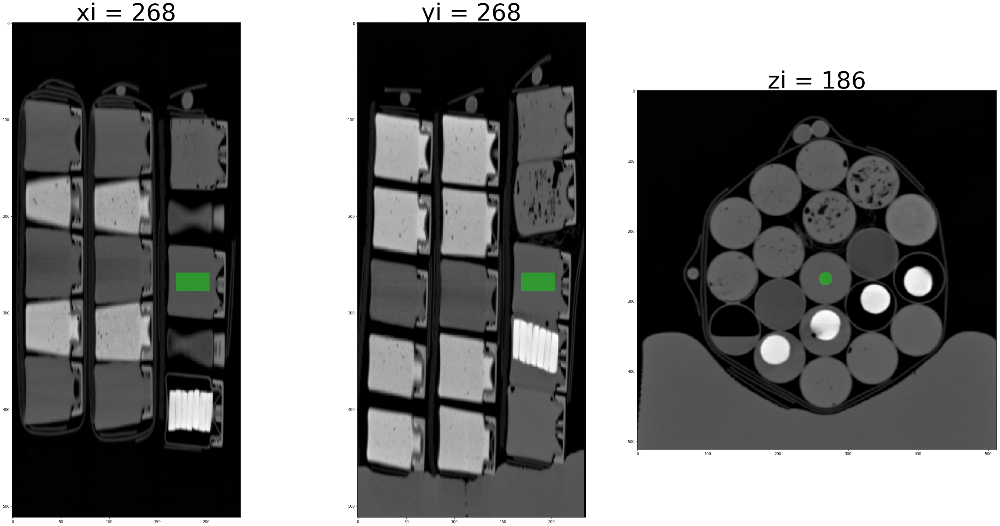

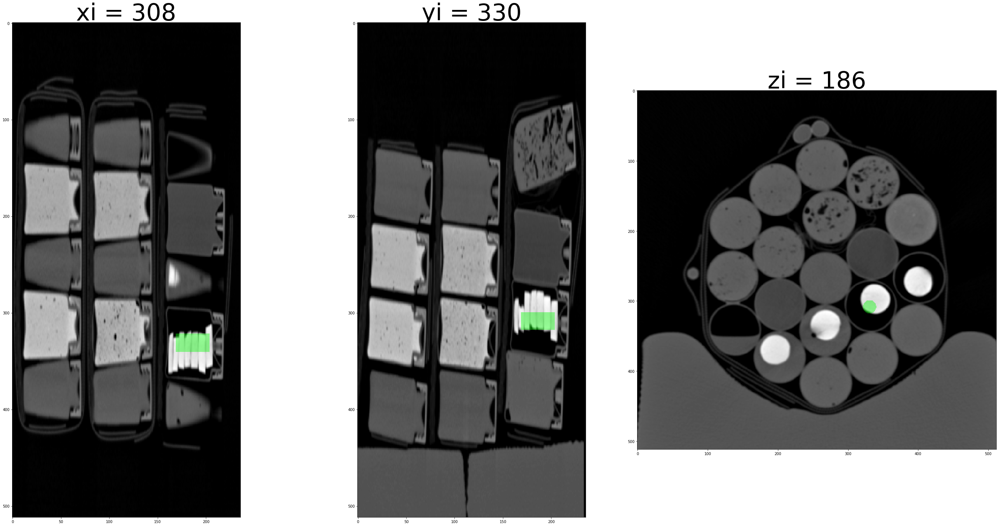

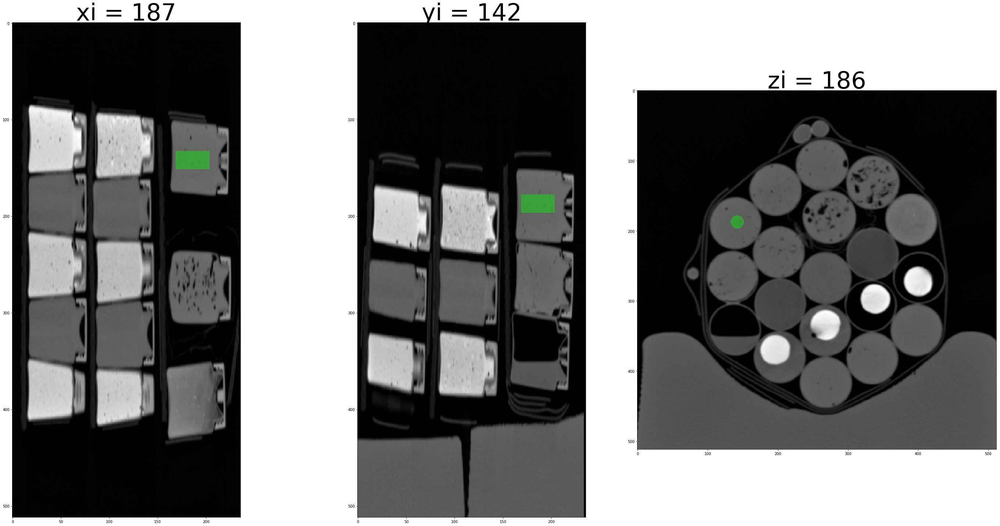

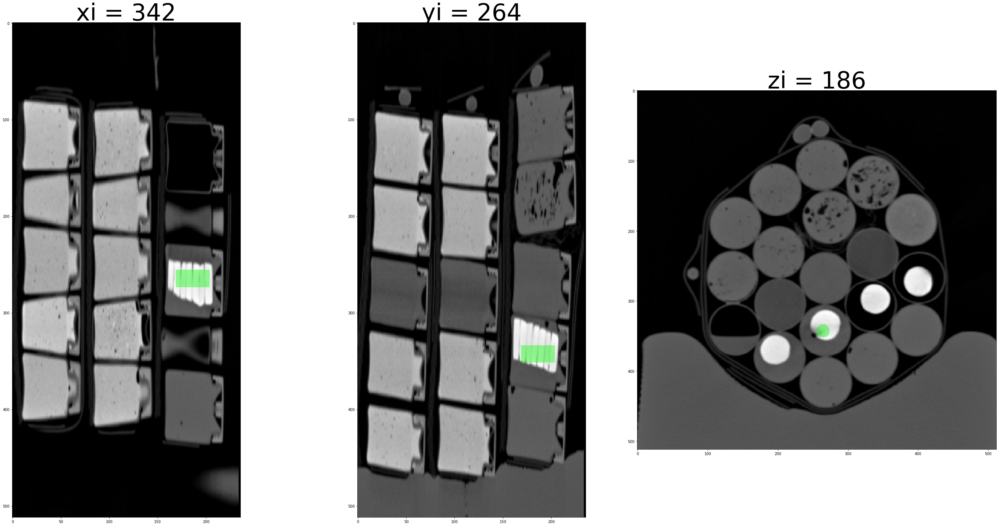

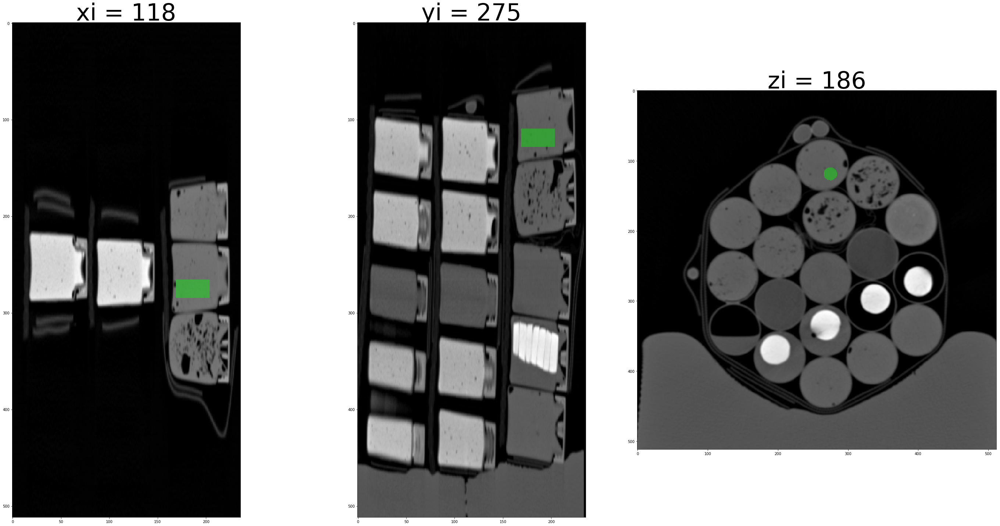

...

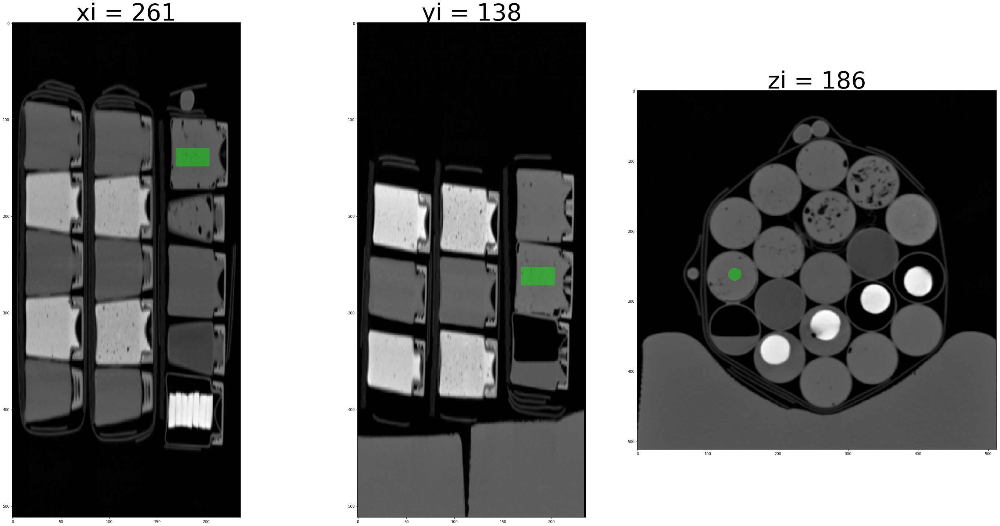

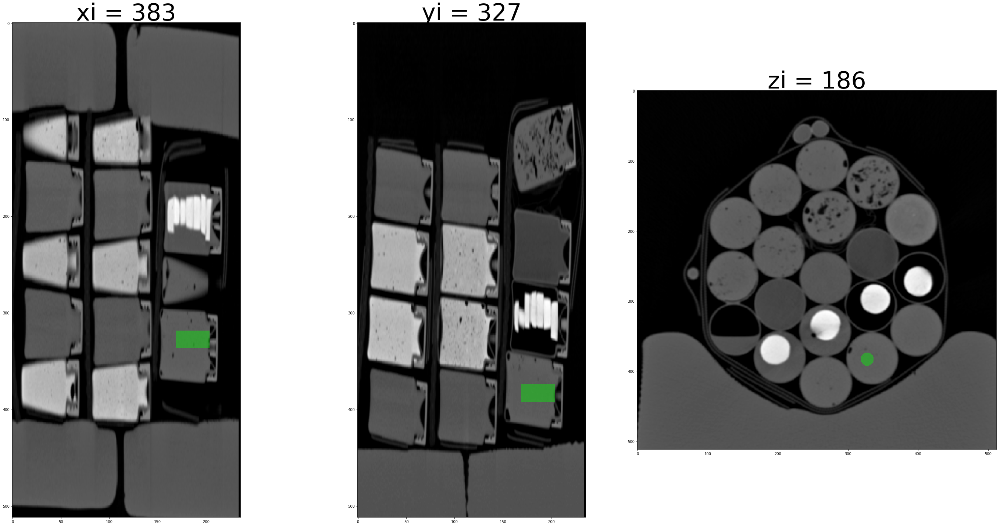

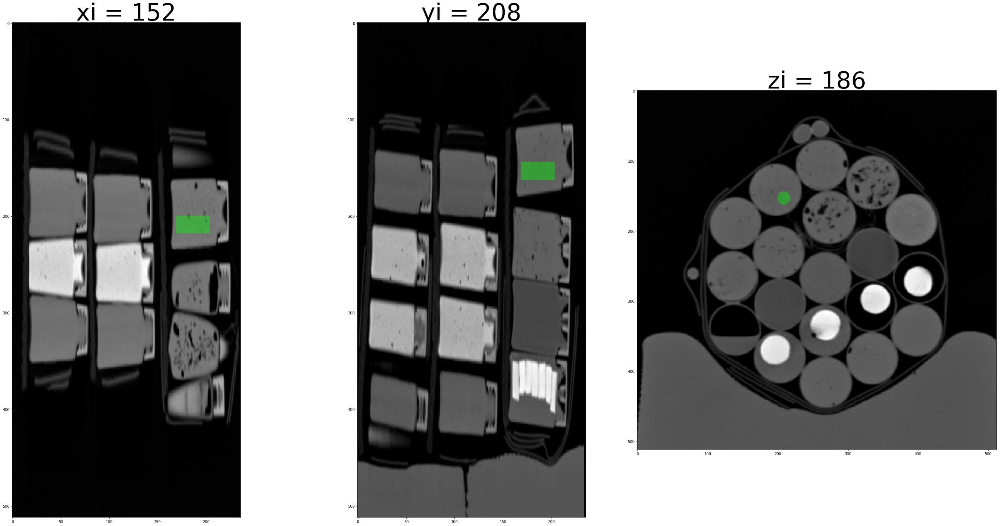

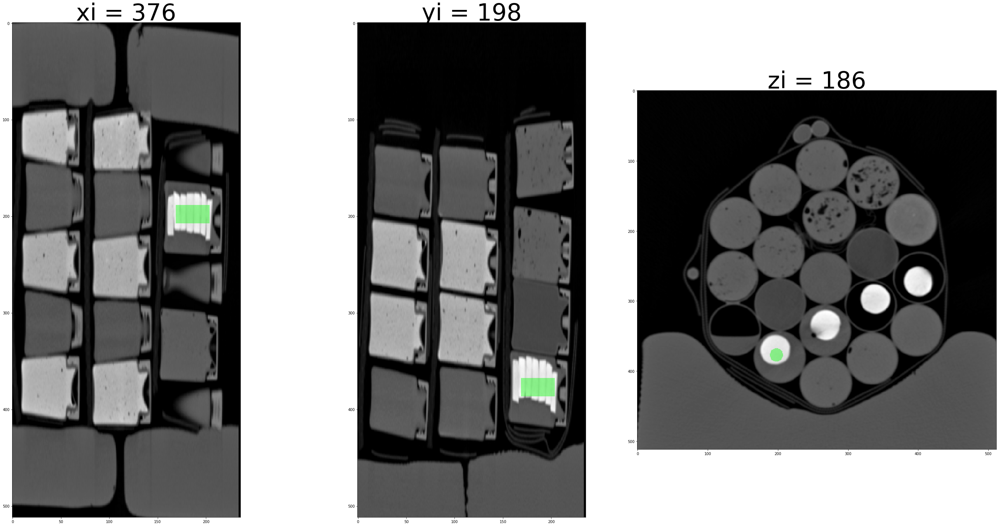

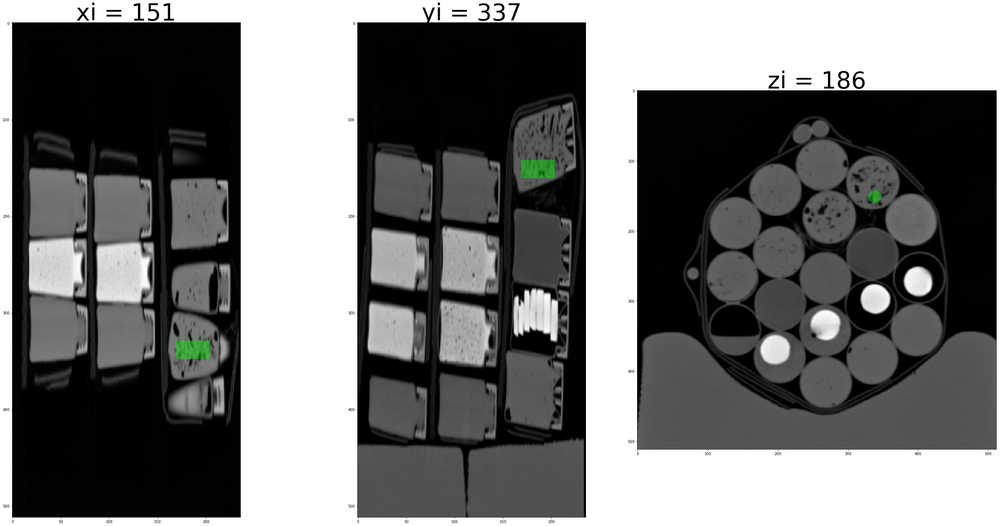

In [7]:
# Plot each ROI through the center

plt.close()
alpha = 0.4

for ci, roi in enumerate(roi_info):
    fig, ax = plt.subplots(1, 3, figsize=(40.0, 20.0))
    
    # Plot a slice in each axis through the ROI center
    cx, cy, cz = (
        int(roi['cx']/dx),
        int(roi['cy']/dy),
        int(roi['cz']/dz)
    )
        
    roi_data = np.zeros((nx, ny, nz, 4), dtype=np.float)
    roi_data[:,:,:,1] = roi['mask']
    roi_data[:,:,:,3] = alpha * roi['mask']
    
    ax[0].imshow(vol[cx,:,:], cmap=plt.cm.gray)
    ax[0].imshow(roi_data[cx,:,:,:])
    ax[0].set_title('xi = {:d}'.format(cx), fontsize=64)
    
    ax[1].imshow(vol[:,cy,:], cmap=plt.cm.gray)
    ax[1].imshow(roi_data[:,cy,:,:])
    ax[1].set_title('yi = {:d}'.format(cy), fontsize=64)
    
    ax[2].imshow(vol[:,:,cz], cmap=plt.cm.gray)
    ax[2].imshow(roi_data[:,:,cz,:])
    ax[2].set_title('zi = {:d}'.format(cz), fontsize=64)
    
    fig.patch.set_facecolor('white')
    fig.tight_layout()

plt.show()

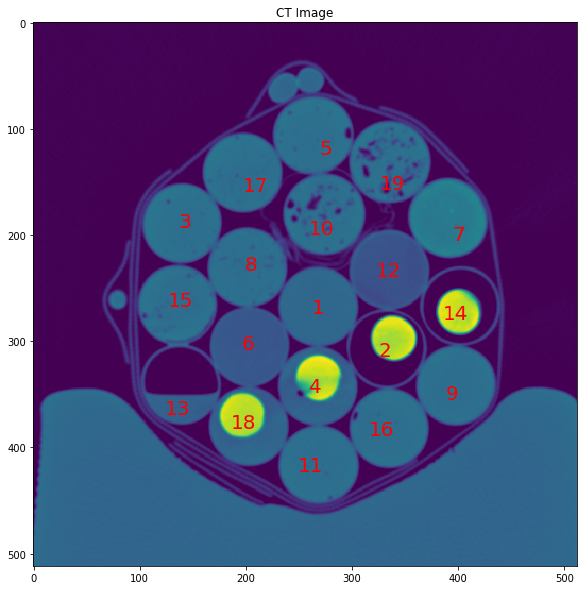

In [8]:
plt.close()
fig = plt.figure(figsize=(10.0, 10.0))

# sli = int(nz/2)
sli = 186
scl_slice = (vol[:,:,sli] - np.min(vol[:,:,sli]))/(np.max(vol[:,:,sli]) - np.min(vol[:,:,sli]))
plt.imshow(scl_slice)

for ci,roi in enumerate(roi_info):
    cx = roi['cx']/dx
    cy = roi['cy']/dy
    #plt.plot(cx, cy, 'rx')
    th = np.linspace(0.0, 2*np.pi, 100)
    xx = rc/dy * np.cos(th) + cy
    yy = rc/dx * np.sin(th) + cx
    #plt.plot(xx, yy, 'r')
    plt.text(cy, cx, '{:d}'.format(ci+1), fontdict = {
        'color': 'red',
        'fontsize': 20,
        'horizontalalignment' : 'center',
        'verticalalignment' : 'center'
    })

fig.patch.set_facecolor('white')
plt.title('CT Image')
plt.show()

fig.savefig('CT_labeled_slice.svg')


In [9]:
# Compute Avg HU within each ROI

for roi in roi_info:
    roi['vox_HU'] = []
    roi['vox_CT_num'] = []
    for zi in range(nz):
        for yi in range(ny):
            for xi in range(nx):
                if (roi['mask'][xi, yi, zi]):
                    roi['vox_HU'].append(vol[xi, yi, zi] - 1000.0)
                    roi['vox_CT_num'].append(vol[xi,yi,zi])
    
    roi['vox_HU'] = np.array(roi['vox_HU'], dtype=np.float)
    roi['vox_CT_num'] = np.array(roi['vox_CT_num'], dtype=np.float)
    roi['mean_HU'] = np.mean(roi['vox_HU'])
    roi['mean_CT_num'] = np.mean(roi['vox_CT_num'])
    
    print('ROI: {:s}\n\t{:d} datapoints...\n\tAvg. HU = {:10.2f}\n\tAvg. CT num = {:10.2f}\n'.format(roi['label'], roi['vox_HU'].size, np.mean(roi['vox_HU']), roi['mean_CT_num']))


ROI: 0: (W01.1) (W01) Water from Tap
	9695 datapoints...
	Avg. HU =      49.56
	Avg. CT num =    1049.56

ROI: 1: (B02.2) (BB2) Bone Block, No Glue, in Air
	9555 datapoints...
	Avg. HU =    1605.58
	Avg. CT num =    2605.58

ROI: 2: (N01.3) (N3) Liver (ground) in 20mL container
	9660 datapoints...
	Avg. HU =     134.07
	Avg. CT num =    1134.07

ROI: 3: (B02.3) (BB3) Bone Block, Glue, in Water
	9520 datapoints...
	Avg. HU =    1804.51
	Avg. CT num =    2804.51

ROI: 4: (N01.1) (N1) Liver (ground) in 20mL container
	9660 datapoints...
	Avg. HU =     142.73
	Avg. CT num =    1142.73

ROI: 5: (A03.1) (IA1) Isopropyl Alcohol
	9450 datapoints...
	Avg. HU =    -160.40
	Avg. CT num =     839.60

ROI: 6: (B01.1) (BMP1) Bone Meal Powder
	9520 datapoints...
	Avg. HU =     249.97
	Avg. CT num =    1249.97

ROI: 7: (L01.3) (LS3(C)) Liver Stability, Fridge
	9555 datapoints...
	Avg. HU =     122.04
	Avg. CT num =    1122.04

ROI: 8: (I01.1) (I1) Intact Liver (Relative), prep: cut and "stuff"
	9660 d

0: (W01.1) (W01) Water from Tap 0.04387152493456481
1: (B02.2) (BB2) Bone Block, No Glue, in Air 0.5118025204528159
2: (N01.3) (N3) Liver (ground) in 20mL container 0.0805736325497368
3: (B02.3) (BB3) Bone Block, Glue, in Water 0.5442535698919062
4: (N01.1) (N1) Liver (ground) in 20mL container 0.08424937132521991
5: (A03.1) (IA1) Isopropyl Alcohol -0.14620920118296965
6: (B01.1) (BMP1) Bone Meal Powder 0.12856377845324243
7: (L01.3) (LS3(C)) Liver Stability, Fridge 0.0754381869783056
8: (I01.1) (I1) Intact Liver (Relative), prep: cut and "stuff" 0.07859909504035462
9: (L01.2) (LS2(B)) Liver Stability, Vacuum 0.007682618007068566
10: (I01.3) (I3) Intact Liver (Relative), prep: cut and "stuff" 0.07882482474108483
11: (A02.1) (A1) Acetone -0.20422322737392548
12: (A04.1) (PA1) Propargyl Alcohol -0.006278168094869843
13: (B02.1) (BB1) Bone Block, Glue, in Air 0.5568472151646656
14: (L01.4) (LS4(D)) Liver Stability, Freezer 0.07528569527730301
15: (I01.2) (I2) Intact Liver (Relative), prep

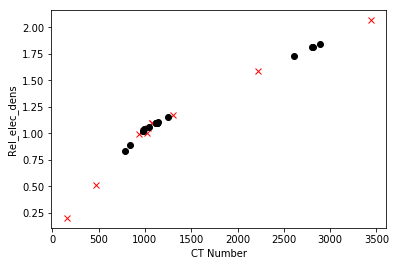

In [19]:
import json

with open('density_reference_table_thomas.json','r') as dref:
    dens_ref = json.loads(dref.read())

# Broke this into two fits, one above and one below CT number of 1000!
low_ct_num = []
low_rel_elec_dens = []
low_physical_dens = []
for dd in dens_ref:
    if (dd['ct_num'] < 1000):
        low_ct_num += [dd['ct_num']]
        low_rel_elec_dens += [dd['rel_elec_dens']]
        low_physical_dens += [dd['physical_dens']]
        
calc_electron_density_low = np.poly1d(
    np.polyfit(low_ct_num, low_rel_elec_dens, 1))
calc_physical_density_low = np.poly1d(
    np.polyfit(low_ct_num, low_physical_dens, 1))
        
high_ct_num = []
high_rel_elec_dens = []
high_physical_dens = []
for dd in dens_ref:
    if (dd['ct_num'] >= 1000):
        high_ct_num += [dd['ct_num']]
        high_rel_elec_dens += [dd['rel_elec_dens']]
        high_physical_dens += [dd['physical_dens']]
        
calc_electron_density_high = np.poly1d(
    np.polyfit(high_ct_num, high_rel_elec_dens, 1))
calc_physical_density_high = np.poly1d(
    np.polyfit(high_ct_num, high_physical_dens, 1))

plt.close()


plt.plot([dd['ct_num'] for dd in dens_ref],
         [dd['rel_elec_dens'] for dd in dens_ref], 'rx')



def ca_concentration(phys_dens):
    # Fit parameters for calcium from paper "A bone composition model for Monte Carlo x-ray transport simulations"
    par = [2.8602, -27.592, 85.805, -60.871]
    percent = par[0]*phys_dens**3 + par[1]*phys_dens**2 + par[2]*phys_dens + par[3]
    return percent/100.0

def w_HA(ca_concentration):
    # Returns concentration by mass of HA.
    # 100% HA corresponds to 39.9% Ca.
    return ca_concentration/0.399

for roi in roi_info:
    if (roi['mean_CT_num'] < 1000):
        roi['fit_elec_dens'] = calc_electron_density_low(roi['mean_CT_num'])
        roi['fit_phys_dens'] = calc_physical_density_low(roi['mean_CT_num'])
    else:
        roi['fit_elec_dens'] = calc_electron_density_high(roi['mean_CT_num'])
        roi['fit_phys_dens'] = calc_physical_density_high(roi['mean_CT_num'])
    roi['calcium_concentration'] = ca_concentration(roi['fit_phys_dens'])
    roi['w_HA'] = w_HA(roi['calcium_concentration'])

    plt.plot(roi['mean_CT_num'], roi['fit_elec_dens'], 'ko')

    
plt.xlabel('CT Number')
plt.ylabel('Rel_elec_dens')
plt.show()

In [20]:
import json
import re

cid_re = re.compile('[A-Z][0-9]{2}\.?[0-9]?')

results = {}
for roi in roi_info:
    cid = cid_re.search(roi['label']).group()
    results[cid] = {
        'label' : roi['label'],
        'data' : {
            'CT Mean HU value' : roi['mean_HU'],
            'CT Mean CT number' : roi['mean_CT_num'],
            'CT fit relative electron density' : roi['fit_elec_dens'],
            'CT fit physical density' : roi['fit_phys_dens'],
            'Calcium Concentration' : roi['calcium_concentration'],
            'w_HA' : roi['w_HA']
        }
    }

with open('ct-results.json','w') as jout:
    jout.write(json.dumps(results, indent=4, sort_keys=True))
